# Create annotations
Zoë Steier
2/8/20

From full dataset (spleen and lymph node, two days, two panels), create annotations.

## Imports and settings

In [1]:
import os
import seaborn as sns
import numpy as np
import torch

from scvi.dataset import CellMeasurement, AnnDatasetFromAnnData, GeneExpressionDataset
from scvi.models import TOTALVI
from scvi.inference import TotalPosterior, TotalTrainer

import anndata
import scanpy as sc
import pandas as pd

from scvi import set_seed
import matplotlib.pyplot as plt

sns.set(context="notebook", font_scale=1.15, style="ticks")
save_path = "mv"
colors = ["#3B7EA1", "#FDB515", "#D9661F", "#859438", "#EE1F60", "#00A598", "#CFDD45"]
sns.set_palette(sns.color_palette(colors))

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

set_seed(0)

In [2]:
colors = ["#3B7EA1", "#FDB515", "#D9661F", "#859438", "#EE1F60", "#00A598"]
sns.set_palette(sns.color_palette(colors))
sns.set(context="paper", font_scale=1, style="ticks") # notebook
#sns.set(context="notebook", font_scale=1.3, style="ticks") # notebook

sns.set_palette(sns.color_palette(colors))
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['savefig.transparent'] = True
sc.settings._vector_friendly = True
DPI = 300

## Load data

In [3]:
post_adata = anndata.read("/data/yosef2/users/zsteier/totalVI/totalVI_journal/spleen_lymph_all/totalVI/sln_all_intersect_results_post_adata.h5ad")

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [5]:
post_adata

AnnData object with n_obs × n_vars = 32648 × 4005 
    obs: 'leiden_totalVI_1.0', 'leiden_totalVI_0.8', 'leiden_totalVI_0.6', 'leiden_totalVI_0.4', 'starter_leiden_subclusters', 'starter_annotations', 'batch_indices', 'n_genes', 'n_protein_counts', 'n_proteins', 'percent_mito', 'seurat_hash_id', 'ADT_CD102_A0104_fore_prob', 'ADT_CD102_A0104', 'ADT_CD103_A0201_fore_prob', 'ADT_CD103_A0201', 'ADT_CD106_A0226_fore_prob', 'ADT_CD106_A0226', 'ADT_CD115(CSF-1R)_A0105_fore_prob', 'ADT_CD115(CSF-1R)_A0105', 'ADT_CD117(c-Kit)_A0012_fore_prob', 'ADT_CD117(c-Kit)_A0012', 'ADT_CD11a_A0595_fore_prob', 'ADT_CD11a_A0595', 'ADT_CD11c_A0106_fore_prob', 'ADT_CD11c_A0106', 'ADT_CD122(IL-2Rb)_A0227_fore_prob', 'ADT_CD122(IL-2Rb)_A0227', 'ADT_CD127(IL-7Ra)_A0198_fore_prob', 'ADT_CD127(IL-7Ra)_A0198', 'ADT_CD134(OX-40)_A0195_fore_prob', 'ADT_CD134(OX-40)_A0195', 'ADT_CD135_A0098_fore_prob', 'ADT_CD135_A0098', 'ADT_CD137_A0194_fore_prob', 'ADT_CD137_A0194', 'ADT_CD140a_A0573_fore_prob', 'ADT_CD140a_A0573', '

## Run standard scanpy normalization of RNA for plotting of raw data

In [22]:
# Normalize for library size (adjust to 10,000 counts/cell)
sc.pp.normalize_per_cell(post_adata, counts_per_cell_after=1e4)

# Log the data
sc.pp.log1p(post_adata)

# Save log(raw) as adata.raw
post_adata.raw = post_adata

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


## Plot proteins

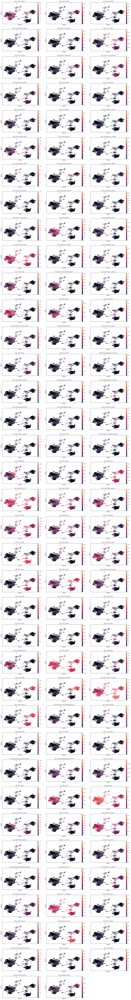

In [6]:
# Plot denoised protein expression
sc.pl.umap(
    post_adata, 
    color=post_adata.uns["totalVI_proteins"], 
    ncols=3, 

)

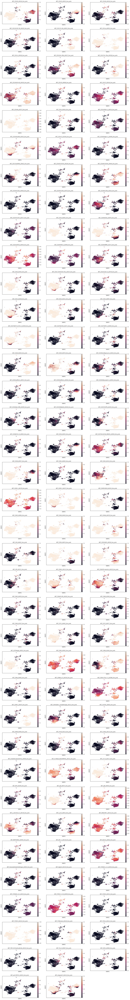

In [7]:
# Plot foreground probability
sc.pl.umap(
    post_adata,
    color=["{}_fore_prob".format(p) for p in post_adata.uns["totalVI_proteins"]],
    ncols=3,
)

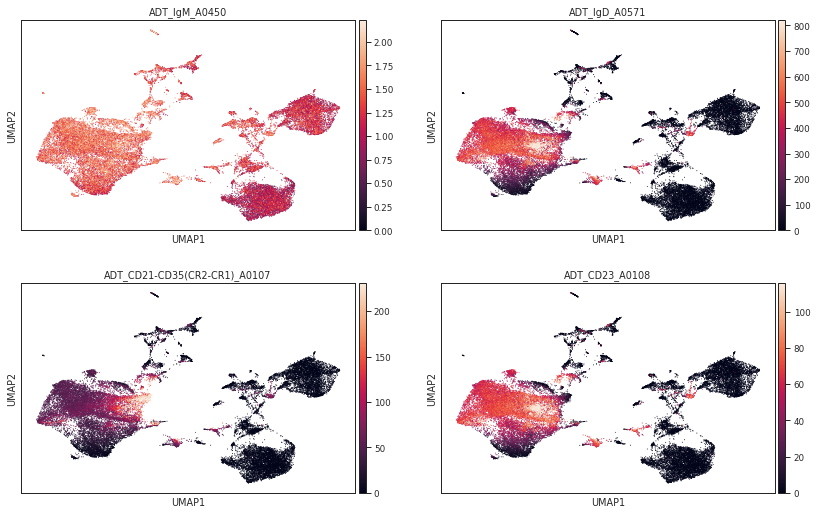

In [11]:
# View a gene
sc.pl.umap(
    post_adata, 
    color=["ADT_IgM_A0450", "ADT_IgD_A0571", "ADT_CD21-CD35(CR2-CR1)_A0107", 'ADT_CD23_A0108' ],
    ncols=2,
    vmax = "p99.5"
)

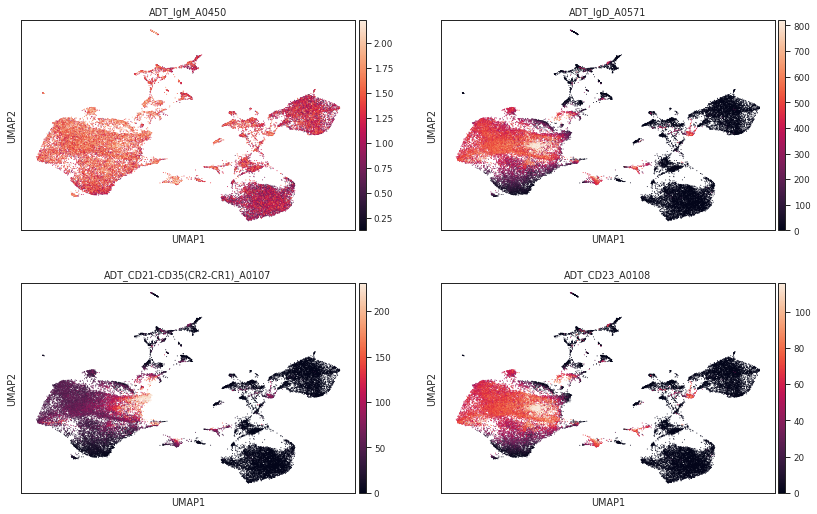

In [12]:
sc.pl.umap(
    post_adata, 
    color=["ADT_IgM_A0450", "ADT_IgD_A0571", "ADT_CD21-CD35(CR2-CR1)_A0107", 'ADT_CD23_A0108' ],
    ncols=2,
    vmax = "p99.5",
    vmin = "p0.05"
)

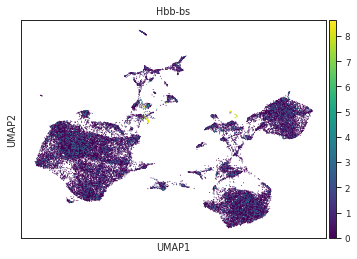

In [84]:
sc.pl.umap(
    post_adata, 
    color=["Hbb-bs"],
    ncols=2,
    #vmax = "p99.5",
    cmap = "viridis"
)

(array([2.101e+03, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 5.451e+03,
        0.000e+00, 0.000e+00, 7.075e+03, 0.000e+00, 0.000e+00, 6.691e+03,
        4.855e+03, 0.000e+00, 3.001e+03, 1.737e+03, 8.590e+02, 4.440e+02,
        2.150e+02, 1.500e+02, 2.800e+01, 2.200e+01, 7.000e+00, 6.000e+00,
        2.000e+00, 0.000e+00, 0.000e+00, 2.000e+00, 0.000e+00, 2.000e+00]),
 array([0.        , 0.12458899, 0.24917798, 0.37376696, 0.49835595,
        0.62294495, 0.7475339 , 0.87212294, 0.9967119 , 1.1213009 ,
        1.2458899 , 1.3704789 , 1.4950678 , 1.6196569 , 1.7442459 ,
        1.8688349 , 1.9934238 , 2.118013  , 2.2426019 , 2.3671908 ,
        2.4917798 , 2.6163688 , 2.7409577 , 2.8655467 , 2.9901357 ,
        3.1147246 , 3.2393138 , 3.3639028 , 3.4884918 , 3.6130807 ,
        3.7376697 ], dtype=float32),
 <a list of 30 Patch objects>)

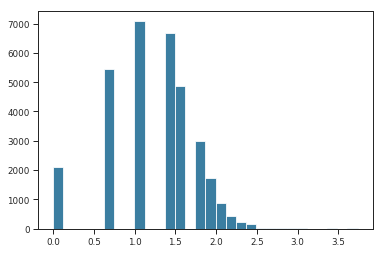

In [17]:
# Consider why IgM is hard to detect - poorly titrated.
plt.hist(np.log1p(post_adata.obsm["protein_expression"][:, post_adata.uns["totalVI_proteins"] == "ADT_IgM_A0450"]), bins = 30)

In [19]:
len(post_adata.obs["starter_leiden_subclusters"].cat.categories)

34

## Plot clusters to annotate

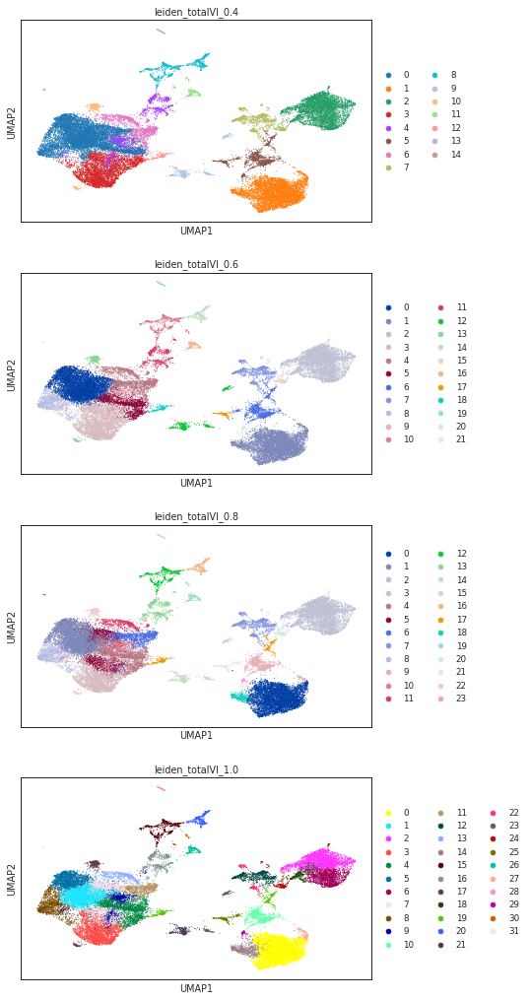

In [8]:
sc.pl.umap(
    post_adata, 
    color=["leiden_totalVI_0.4", "leiden_totalVI_0.6", "leiden_totalVI_0.8", "leiden_totalVI_1.0"],
    ncols=1
)

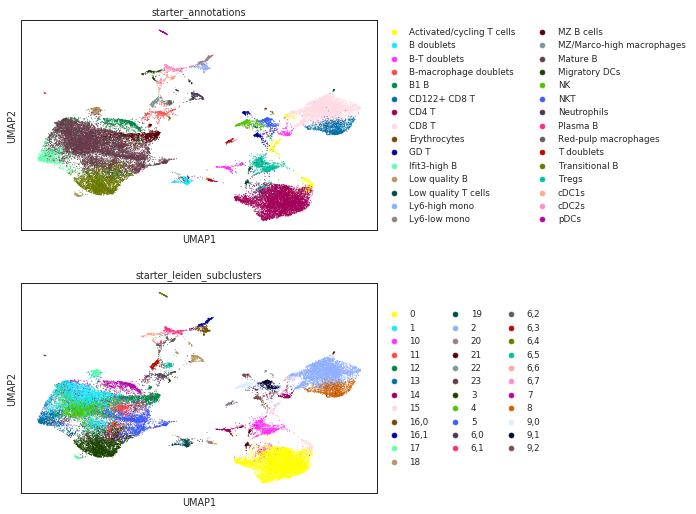

In [9]:
sc.pl.umap(
    post_adata, 
    color=["starter_annotations", "starter_leiden_subclusters",],
    ncols=1
)

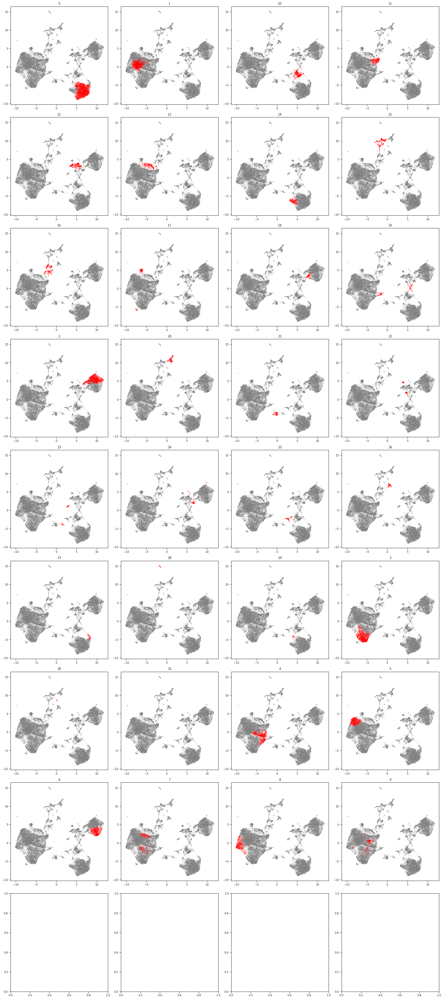

In [10]:
# Plot each cluster independently

fig, ax = plt.subplots(9, 4, figsize=(20, 45))
clusters = np.array((post_adata.obs["leiden_totalVI_1.0"])).ravel()
for c in range(len(np.unique(clusters))):
    ax.flat[c].scatter(x = post_adata.obsm["X_umap"][clusters==np.unique(clusters)[c]][:, 0], y = post_adata.obsm["X_umap"][clusters==np.unique(clusters)[c]][:, 1], s=.1,
                      c = "red")
    ax.flat[c].scatter(x = post_adata.obsm["X_umap"][clusters!=np.unique(clusters)[c]][:, 0], y = post_adata.obsm["X_umap"][clusters!=np.unique(clusters)[c]][:, 1], s=.1,
                      c = "grey")
    ax.flat[c].set_title(str(np.unique(clusters)[c]), fontsize = 10)

plt.tight_layout()

## Make annotations

Start with leiden clusters at res 1.0. Subcluster as necessary.

In [34]:
# Subcluster 12 into two clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_totalVI_1.0", ["12"]), key_added="leiden_NK_sub_0.1", resolution=0.1)

In [54]:
# Subcluster 20 into two clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_NK_sub_0.1", ["20"]), key_added="leiden_mono_sub_0.1", resolution=0.1)

In [58]:
# Subcluster 24 into three clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_mono_sub_0.1", ["24"]), key_added="leiden_RBC_sub_0.1", resolution=0.1)

In [62]:
# Subcluster 15 into three clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_RBC_sub_0.1", ["15"]), key_added="leiden_DC_sub_0.1", resolution=0.1)

In [85]:
# Subcluster 16 into four clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_DC_sub_0.1", ["16"]), key_added="leiden_MP_sub_0.2", resolution=0.2)

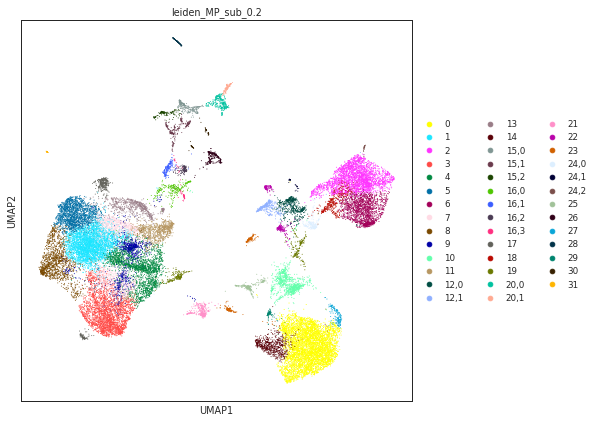

In [86]:
# Plot subclusterings

fig, ax = plt.subplots(figsize=(7, 7))
sc.pl.umap(
    post_adata, 
    color= ["leiden_MP_sub_0.2"], #"leiden_mono_sub_0.1"
    #ncols=2, 
    ax = ax
)

In [18]:
# Subcluster 10 into two clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_subclusters_41", ["10"]), key_added="leiden_Treg_sub_0.2", resolution=0.2)

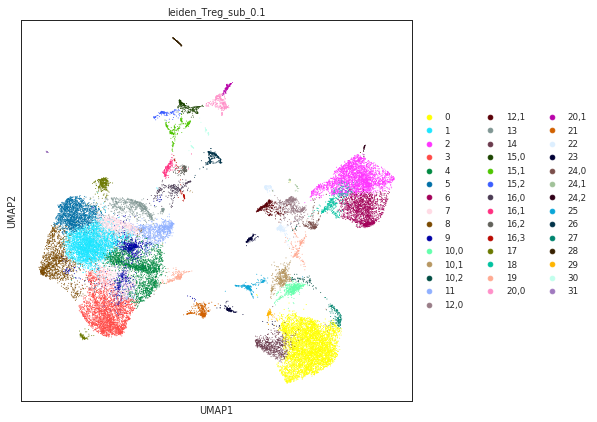

In [19]:
# Plot subclusterings

fig, ax = plt.subplots(figsize=(7, 7))
sc.pl.umap(
    post_adata, 
    color= ["leiden_Treg_sub_0.1"], #"leiden_mono_sub_0.1"
    #ncols=2, 
    ax = ax
)

In [16]:
# Make dictionary of annotations
annotations = {"0": "CD4 T cells",
              "1": "1: Mature B cells",
              "2": "CD8 T cells",
              "3": "Transitional B cells",
              "4": "4: Mature B cells",
              "5": "5: Mature B cells",
              "6": "CD122+ CD8 T cells",
              "7": "7: Mature B cells",
              "8": "8: Ifit3-high B cells",
              "9": "9: Mature B cells",
              "10,0": "Tregs",
              "10,1": "CXCR3+ Tregs",
              "10,2": "Tregs",
              "11": "MZ B cells",
              "12,0": "NKT cells",
              "12,1": "NK cells",
              "13": "B1 B cells",
              "14": "Ifit3-high CD4 T cells",
              "15,0": "cDC2s",
              "15,1": "cDC1s",
              "15,2": "Migratory DCs",
              "16,0": "B-macrophage doublets",
              "16,1": "MZ/Marco-high macrophages",
              "16,2": "Red-pulp macrophages",
              "16,3": "Erythrocytes",
              "17": "Low quality B cells",
              "18": "Ifit3-high CD8 T cells",
              "19": "Cycling B/T cells", 
              "20,0": "Ly6-high monocytes",
              "20,1": "Ly6-low monocytes", 
              "21": "B doublets",
              "22": "GD T cells",
              "23": "T doublets",
              "24,0": "B-CD8 T cell doublets",
              "24,1": "Erythrocytes",
              "24,2": "Low quality T cells",
              "25": "B-CD4 T cell doublets",
              "26": "Neutrophils",
              "27": "Activated CD4 T cells",
              "28": "pDCs",
              "29": "Low quality T cells",
              "30": "Neutrophils",
              "31": "Plasma B cells"}

In [17]:
len(annotations)

43

In [ ]:
# Starter annotations
# annotations = {"0": "CD4 T cells", # Cd4
#               "1": "Mature B cells" , # Cd19, Igd
#               "2": "CD8 T cells", # Cd8a
#               "3": "Transitional B cells", # IgM+, IgD-, https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2195560/
#               "4": "Mature B cells", # Cd19, Igd
#               "5": "Mature B cells", # Cd19, Igd,  Cd83 high (light zone?), Ddx21, C1qb, some cycling (Birc5),
#                "6,0": "B-macrophage doublets", # mix of B cell types with macrophage markers
#                "6,1": "cDC2s", # Cd11c, itgax, h2-aa, low cd4, aka CD4-cDC
#                "6,2": "cDC1s", # clec9, cd8a, xcr1, aka CD9-cDC: https://rupress.org/jem/article/207/6/1247/40924/Human-CD141-BDCA-3-dendritic-cells-DCs-represent-a, https://www.miltenyibiotec.com/US-en/resources/macs-handbook/mouse-cells-and-organs/mouse-cell-types/dendritic-cells-mouse.html
#                "6,3": "MZ/Marco-high macrophages", # Marginal zone macrophage/Marco high in lymph node, Cd209b (SIGNR1): https://www.frontiersin.org/articles/10.3389/fimmu.2015.00480/full#B3
#                "6,4": "pDCs", # Siglech, Irf8, runx2
#                "6,5": "Red-pulp macrophages", # F4/80, c1qa, c1qb, c1qc, hmox1, hebp1, vcam1 
#                "6,6": "Migratory DCs", # Migratory DCs: slco5a1, anxa3, slip2, CD103, Nudt17, adcy6, eno2, il15ra, cacnb3, tmem123, fscn1  http://www.immgen.org/ImmGenPublications/ni.2370.pdf
#                "6,7": "Migratory DCs", # Migratory DCs: slco5a1, anxa3, slip2, CD103, Nudt17, adcy6, eno2, il15ra, cacnb3, tmem123, fscn1  http://www.immgen.org/ImmGenPublications/ni.2370.pdf
#               "7": "B1 B cells",# Bhlhe41, https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5363839/
#               "8": "CD122+ CD8 T cells", # "CD8 Tregs", CD122, CD62L, CXCR3, https://onlinelibrary.wiley.com/doi/full/10.1002/eji.200939314, https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4610204/
#                "9,0": "NK cells", # Nk1.1, no cd3e, gzma, ncr1
#                "9,1": "NKT cells", # Nk1.1, Cd3e, ccl5, klrd1
#                "9,2": "GD T cells", # Cd3e, tcrg-c1, tcrg-c2, maf, il17re, il17rb,  https://www.biorxiv.org/content/10.1101/478529v2.full.pdf+html see figure 2b
#               "10": "Tregs", # Foxp3
#               "11": "Mature B cells", # Cd19, Igd,  high n_proteins
#               "12": "MZ B cells",# IgM+CD21+, IgD-CD23-
#               "13": "Ifit3-high B cells", # Cd19, Ifit3
#               "14": "B-T doublets", # Cd19, Cd4, Cd8a
#               "15": "Activated/cycling T cells", # Birc5, Itm2a, Cd69, mix of CD4 and CD8
#                "16,0": "Ly6-high monocytes", # Ly6c2, Fn1, F13a1, aka inflammatory monocytes:  https://www.bio-rad-antibodies.com/monocyte-minireview.html
#                "16,1": "Ly6-low monocytes", # Cd36, Cd300e, Fabp4, aka resident monocytes:  https://www.bio-rad-antibodies.com/monocyte-minireview.html
#               "17": "Low quality B cells", # low library sizes
#               "18": "Neutrophils", # S100a8
#               "19": "B doublets", # B-monocyte? doublets
#               "20": "T doublets", # T-monocyte?
#               "21": "Low quality T cells", # low library sizes
#               "22": "Erythrocytes", # Hbb-bs
#               "23": "Plasma B cells", # Jchain
#               }

# Tregs: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5150376/, https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2993590/, https://www.cell.com/immunity/pdfExtended/S1074-7613(19)30001-9, https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5808295/

## Save annotation results

Save results as csv and as anndata (when creating totalVI results).

In [20]:
# Save the results in a dataframe: cluster number, label
#annotation_sub = post_adata.obs["leiden_MP_sub_0.2"],
annotation_sub = post_adata.obs["leiden_Treg_sub_0.2"]

In [21]:
labels = [annotations[c] for c in post_adata.obs["leiden_Treg_sub_0.2"]]

In [22]:
annot_df = pd.DataFrame({'leiden_subclusters': pd.Series(annotation_sub.values), 
                         'labels':pd.Series(labels)})

In [23]:
annot_df.to_csv("/data/yosef2/users/zsteier/totalVI/totalVI_journal/spleen_lymph_all/annotations/annotations_subclustered.csv")